# 08wk-2, 09wk-1: (XAI, 설명가능한 인공지능) – Class Activation Map

최규빈  
2025-04-28

<a href="https://colab.research.google.com/github/guebin/DL2025/blob/main/posts/08wk-2.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

# 1. 강의영상

<https://youtu.be/playlist?list=PLQqh36zP38-xSNl_w0O7cFtVm9BH-5uas&si=ia6g7bNOK66tX4L1>

# 2. Imports

In [1]:
import torch
import torchvision
import PIL
import requests
import io
import matplotlib.pyplot as plt

# 3. `torch.einsum`

## A. transpose

`-` test tensor

In [3]:
tsr = torch.arange(12).reshape(4,3)
tsr

`-` 행렬을 transpose하는 방법1

In [4]:
tsr.t()

`-` 행렬을 transpose하는 방법2

In [5]:
torch.einsum('ij -> ji', tsr)

## B. 행렬곱

`-` test tensors

In [6]:
tsr1 = torch.arange(12).reshape(4,3).float()
tsr2 = torch.arange(15).reshape(3,5).float()
tsr1,tsr2

`-` 행렬곱을 수행하는 방법1

In [7]:
tsr1 @ tsr2

`-` 행렬곱을 수행하는 방법2

In [8]:
torch.einsum('ij, jk -> ik', tsr1,tsr2)

## C. `img_plt` vs `img_pytorch`

`-` r,g,b 를 의미하는 tensor

In [9]:
r = torch.zeros(16).reshape(4,4) + 1.0
g = torch.zeros(16).reshape(4,4)
b = torch.zeros(16).reshape(4,4)

`-` torch를 쓰기 위해서는 이미지가 이렇게 저장되어 있어야함

In [10]:
img_pytorch = torch.stack([r,g,b],axis=0).reshape(1,3,4,4)
print(img_pytorch)
print(img_pytorch.shape)

tensor([[[[1., 1., 1., 1.],
          [1., 1., 1., 1.],
          [1., 1., 1., 1.],
          [1., 1., 1., 1.]],

         [[0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.]],

         [[0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.]]]])
torch.Size([1, 3, 4, 4])

`-` matplotlib로 시각화를 하기 위해서는 이미지가 이렇게 저장되어
있어야함

tensor([[[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]]])
torch.Size([4, 4, 3])

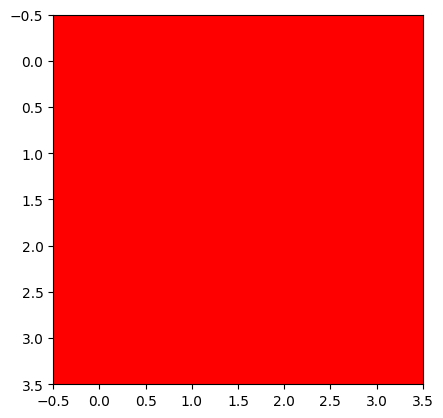

In [11]:
img_matplotlib = torch.stack([r,g,b],axis=-1)
print(img_matplotlib)
print(img_matplotlib.shape)
plt.imshow(img_matplotlib)

`-` `img_pytorch` 를 `plt.imshow`로 시각화

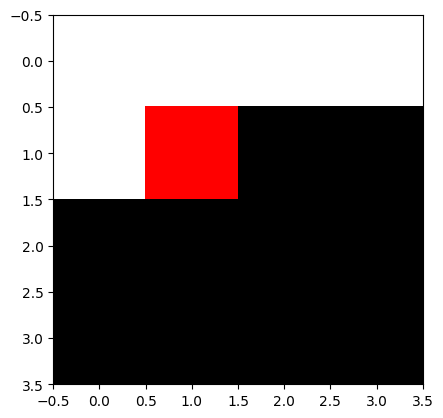

In [12]:
# 잘못된코드
plt.imshow(img_pytorch.squeeze().reshape(4,4,3))

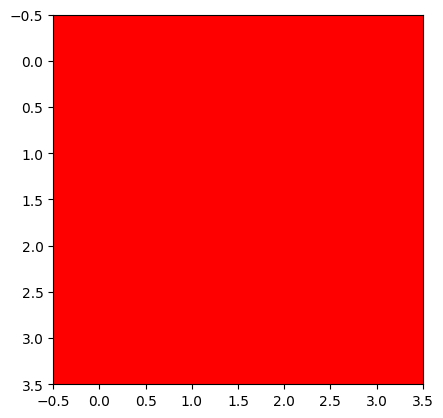

In [13]:
# 올바른코드1
plt.imshow(torch.einsum('cij -> ijc', img_pytorch.squeeze()))

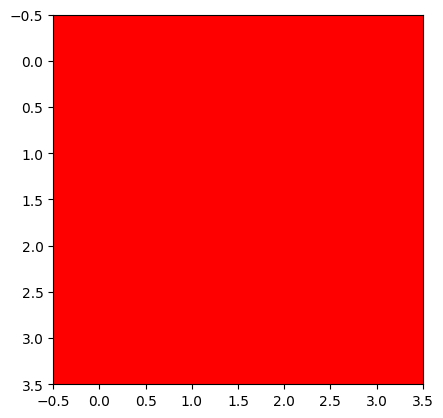

In [14]:
# 올바른코드2
plt.imshow(img_pytorch.squeeze().permute(1,2,0))

# 4. 이미지 자료 처리

## A. 데이터

`-` 데이터 다운로드

In [15]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category'
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category'
)

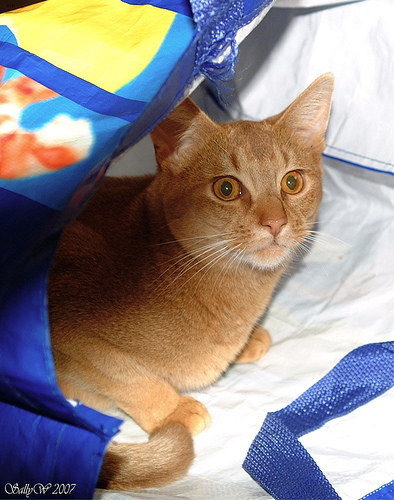

In [16]:
train_dataset[0][0]

In [17]:
train_dataset[0][1]

## B. 이미지 변환

`-` `x_pil` 을 tensor로 바꾸어 보자.

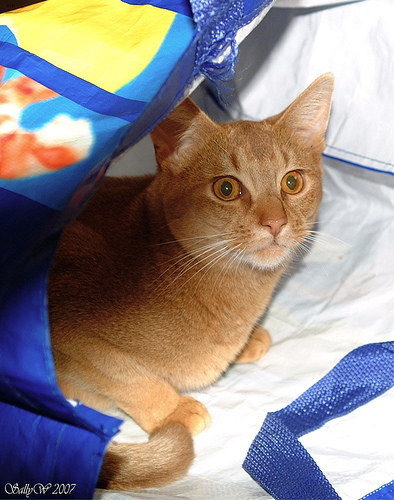

In [18]:
x_pil = train_dataset[0][0]
x_pil

In [19]:
to_tensor = torchvision.transforms.ToTensor() # PIL를 텐서로 만드는 함수를 리턴
to_tensor(x_pil) 

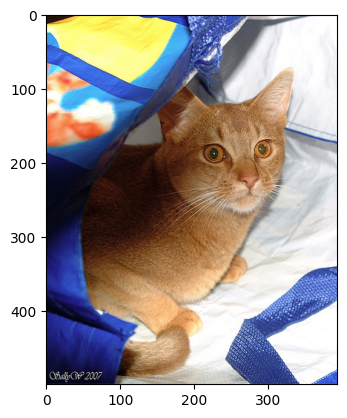

In [20]:
plt.imshow(to_tensor(x_pil) .permute(1,2,0))

`-` 궁극적으로는 `train_dataset`의 모든 이미지를 `(3680,3,???,???)`로
정리하여 `X`라고 하고 싶음. $\to$ 이걸 하기 위해서는 이미지 크기를
통일시켜야함. $\to$ 이미지크기를 통일시키는 방법을 알아보자.

In [21]:
resize = torchvision.transforms.Resize((512,512)) # 512,512로 이미지를 조정해주는 함수가 리턴

In [22]:
to_tensor(resize(train_dataset[0][0])).shape

`-` 크기가 8인 이미지들의 배치를 만들기

In [23]:
Xm = torch.stack([to_tensor(resize(train_dataset[n][0])) for n in range(8)],axis=0)
Xm.shape

# 5. AP Layer

## A. AP layer

In [26]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)

In [27]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4).float()
X

In [28]:
ap(X) # 채널별평균

## B. AP, Linear의 교환

`-` 신기한것 보여줄게요..

In [29]:
r = X[:,0,:,:]
g = X[:,1,:,:]
b = X[:,2,:,:]

In [30]:
ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

In [31]:
ap(r*0.1 + g*0.2 + b*0.3)

-   신기한게 아니고 당연하죠..

`-` 위의 두 계산결과를 `torch.nn.AdaptiveAvgPool2d`, `torch.nn.Linear`,
그리고 `torch.nn.Flatten()`을 조합하여 구현해보자.

In [156]:
resnet18

In [32]:
# ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
flattn = torch.nn.Flatten()
linr = torch.nn.Linear(3,1,bias=False)
linr.weight.data = torch.tensor([[ 0.1,  0.2, 0.3]])
#---#
print(X.shape)
print(ap(X).shape) # ap(r), ap(g), ap(b) 의 값이 들어있음.
print(flattn(ap(X)).shape) # [ap(r), ap(g), ap(b)] 형태로
print(linr(flattn(ap(X))).shape) # ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

torch.Size([1, 3, 4, 4])
torch.Size([1, 3, 1, 1])
torch.Size([1, 3])
torch.Size([1, 1])

In [33]:
#ap(r*0.1 + g*0.2 + b*0.3)
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
flattn = torch.nn.Flatten()
linr = torch.nn.Linear(3,1,bias=False)
linr.weight.data = torch.tensor([[ 0.1,  0.2, 0.3]])
#---#
def _linr(X):
    return torch.einsum('ocij, kc -> okij', X, linr.weight.data)
#---#
print(X.shape) # 
print(_linr(X).shape) # r*0.1 + g*0.2 + b*0.3 
print(ap(_linr(X)).shape) # ap(r*0.1 + g*0.2 + b*0.3 )
print(flattn(ap(_linr(X))).shape)

torch.Size([1, 3, 4, 4])
torch.Size([1, 1, 4, 4])
torch.Size([1, 1, 1, 1])
torch.Size([1, 1])

# 6. CAM(Zhou et al. 2016)의 구현

ref: <https://arxiv.org/abs/1512.04150>

`-` 이 강의노트는 위의 논문의 내용을 재구성하였음.

## A. 0단계 – (X,y), (XX,yy)

In [34]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category',
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category',
)

In [35]:
compose = torchvision.transforms.Compose([
    torchvision.transforms.Resize((512,512)),
    torchvision.transforms.ToTensor()
])

In [36]:
X = torch.stack([compose(train_dataset[i][0]) for i in range(3680)],axis=0)
XX = torch.stack([compose(test_dataset[i][0]) for i in range(3669)],axis=0)
y = torch.tensor([train_dataset[i][1] for i in range(3680)]).reshape(-1,1).float()
yy = torch.tensor([test_dataset[i][1] for i in range(3669)]).reshape(-1,1).float()

## B. 1단계 – 이미지분류 잘하는 네트워크 선택 후 학습

In [37]:
torch.manual_seed(43052)
#--Step1
ds_train = torch.utils.data.TensorDataset(X,y)
dl_train = torch.utils.data.DataLoader(ds_train, batch_size=32, shuffle=True)
ds_test = torch.utils.data.TensorDataset(XX,yy)
dl_test = torch.utils.data.DataLoader(ds_test, batch_size=32)
#--Step2
resnet18 = torchvision.models.resnet18(pretrained=True)
resnet18.fc = torch.nn.Linear(512,1)
loss_fn = torch.nn.BCEWithLogitsLoss()
optimizr = torch.optim.Adam(resnet18.parameters(), lr=1e-5)
#--Step3 
resnet18.to("cuda:0")
for epoc in range(3):
    resnet18.train()
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        #1
        netout = resnet18(Xm)
        #2
        loss = loss_fn(netout,ym)
        #3
        loss.backward()
        #4
        optimizr.step()
        optimizr.zero_grad()
    #---# 
    resnet18.eval()
    s = 0 
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        s = s + ((resnet18(Xm).data > 0) == ym).sum().item()
    acc = s/3680
    print(f"train_acc = {acc:.4f}")
#--Step4 
resnet18.eval()
s = 0 
for Xm,ym in dl_test:
    Xm = Xm.to("cuda:0")
    ym = ym.to("cuda:0")
    s = s + ((resnet18(Xm).data > 0) == ym).sum().item()
acc = s/3669
print(f"test_acc = {acc:.4f}")

/home/cgb3/anaconda3/envs/dl2025/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/cgb3/anaconda3/envs/dl2025/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)

train_acc = 0.9815
train_acc = 0.9973
train_acc = 0.9995
test_acc = 0.9951

## C. 2단계– Linear와 AP의 순서를 바꿈

`-` `resnet18` 을 재구성하여 `net` 를 만들자.

In [38]:
stem = torch.nn.Sequential(
    torch.nn.Sequential(
        resnet18.conv1,
        resnet18.bn1,
        resnet18.relu,
        resnet18.maxpool
    ),
    resnet18.layer1,
    resnet18.layer2,
    resnet18.layer3,
    resnet18.layer4
)
head = torch.nn.Sequential(
    resnet18.avgpool,
    torch.nn.Flatten(),
    resnet18.fc
)
net = torch.nn.Sequential(
    stem,
    head
)

`-` 1개의 observation을 고정

In [39]:
x = X[[0]].to("cuda:0")

In [40]:
net(x), resnet18(x)

`-` 위와 같은 값 -5.5636이 나오는 과정을 추적하여 보자.

In [42]:
# 계산방식1: 원래계산방식
ap = head[0]
flattn = head[1]
linr = head[2]
#---#
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{ap(stem(x)).shape} -- ap(stem(x))")
print(f"{flattn(ap(stem(x))).shape} -- flattn(ap(stem(x)))")
print(f"{linr(flattn(ap(stem(x)))).shape} -- linr(flattn(ap(stem(x))))")

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 512, 1, 1]) -- ap(stem(x))
torch.Size([1, 512]) -- flattn(ap(stem(x)))
torch.Size([1, 1]) -- linr(flattn(ap(stem(x))))

**현재 네트워크**
$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linr}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$

**바꾸고 싶은 네트워크**
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{\_linr}{\to} \underset{(1,1,16,16)}{{\boldsymbol \sharp}}\overset{ap}{\to} \underset{(1,1,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$

In [45]:
# 계산방식2
ap = head[0]
flattn = head[1]
linr = head[2]
def _linr(xtilde):
    return torch.einsum('ocij, kc -> okij', xtilde, linr.weight.data) + linr.bias.data
#---#
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{_linr(stem(x)).shape} -- _linr(stem(x))")
print(f"{ap(_linr(stem(x))).shape} -- ap(_linr(stem(x)))")
print(f"{flattn(ap(_linr(stem(x)))).shape} -- flattn(ap(_linr(stem(x))))")

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 1, 16, 16]) -- _linr(stem(x))
torch.Size([1, 1, 1, 1]) -- ap(_linr(stem(x)))
torch.Size([1, 1]) -- flattn(ap(_linr(stem(x))))

In [46]:
linr(flattn(ap(stem(x)))), flattn(ap(_linr(stem(x))))

### $\star$ 잠깐 멈추고 생각 좀 해보자..

`-` 원래 계산방식을 적용

In [57]:
linr(flattn(ap(stem(x))))

`-` 바뀐 계산방식을 적용

In [61]:
flattn(ap(_linr(stem(x))))

`-` 바뀐 계산방식을 좀더 파고 들어서 분석해보자.

In [69]:
_linr(stem(x)).long()

-   여러가지 값들이 있지만 (16\*16=256개의 값들) 아무튼 이 값들의 평균은
    -5.5613 임. (이 값이 작을수록 이 그림은 고양이라는 의미임)
-   그런데 살펴보니까 대부분의 위치에서 -에 가까운 값을가지고,
    특정위치에서만 엄청 작은 값이 존재하여 -5.5613 이라는 평균값이
    나오는 것임.
-   결국 이 특정위치에 존재하는 엄청 작은 값들이 `x`가 고양이라고
    판단하는 근거가 된다.

In [74]:
why = _linr(stem(x)) 

**바꾸고 싶은 네트워크** – why라는 이름을 적용하여
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{\_linr}{\to} \underset{(1,1,16,16)}{\bf why}\overset{ap}{\to} \underset{(1,1,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$

## D. 3단계 – WHY 시각화

`#` 시각화1 – why와 img를 겹쳐서 그려보자.

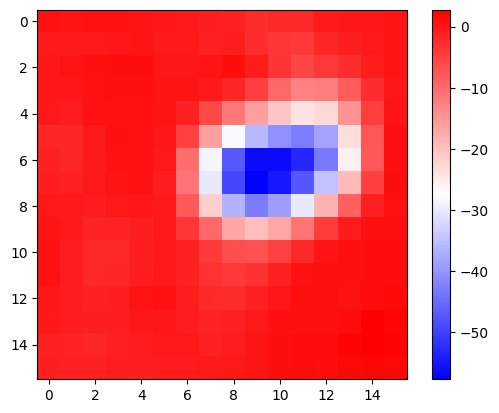

In [93]:
plt.imshow(why.squeeze().cpu().detach(),cmap="bwr")
plt.colorbar()

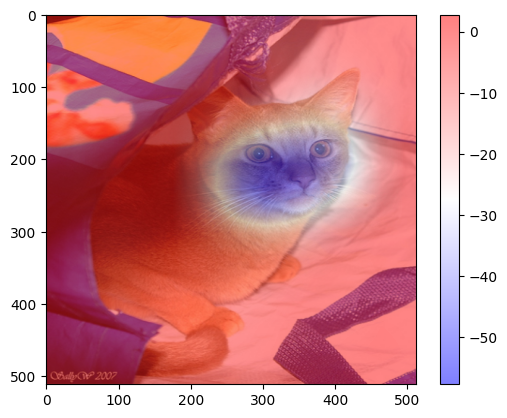

In [103]:
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="bwr",alpha=0.5)
plt.colorbar()

`#`

`#` 시각화2 – colormap을 `magma`로 적용

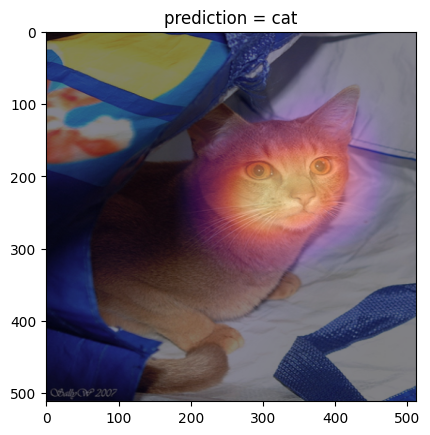

In [121]:
x = X[[0]].to("cuda:0")
if net(x) > 0: 
    pred = "dog"
    why = _linr(stem(x)) 
else: 
    pred = "cat" 
    why = - _linr(stem(x)) 
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`#`

`#` 시각화3 – 하니를 시각화해보자.

In [124]:
url = 'https://github.com/guebin/DL2025/blob/main/imgs/hani1.jpeg?raw=true'
hani_pil = PIL.Image.open(
    io.BytesIO(requests.get(url).content)
)

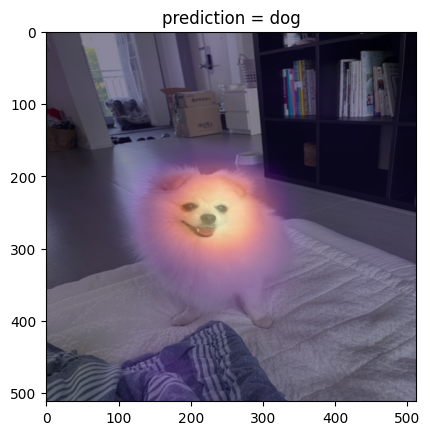

In [136]:
x = compose(hani_pil).reshape(1,3,512,512).to("cuda:0")
if net(x) > 0: 
    pred = "dog"
    why = _linr(stem(x)) 
else: 
    pred = "cat" 
    why = - _linr(stem(x)) 
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`#`

`#` 시각화4 – `XX`의 이미지를 시각화해보자.

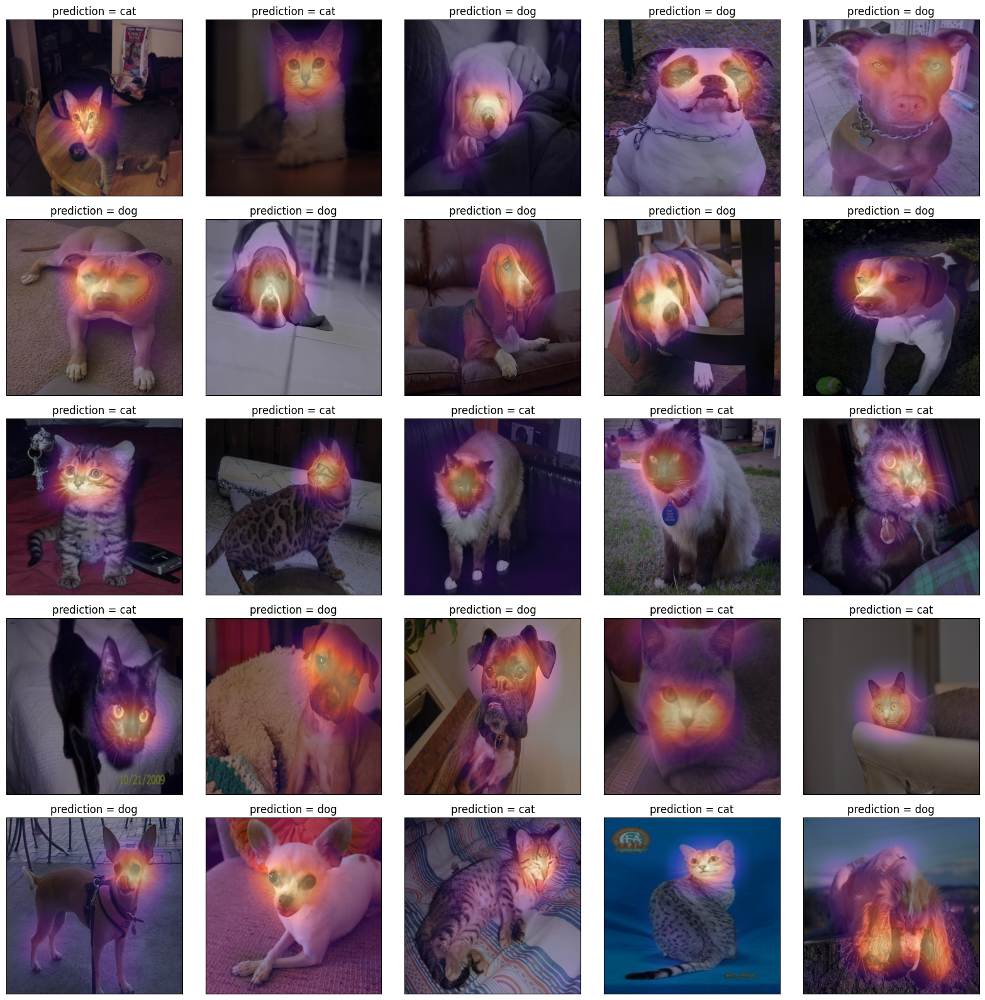

In [152]:
fig, ax = plt.subplots(5,5)
#---#
k = 0 
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

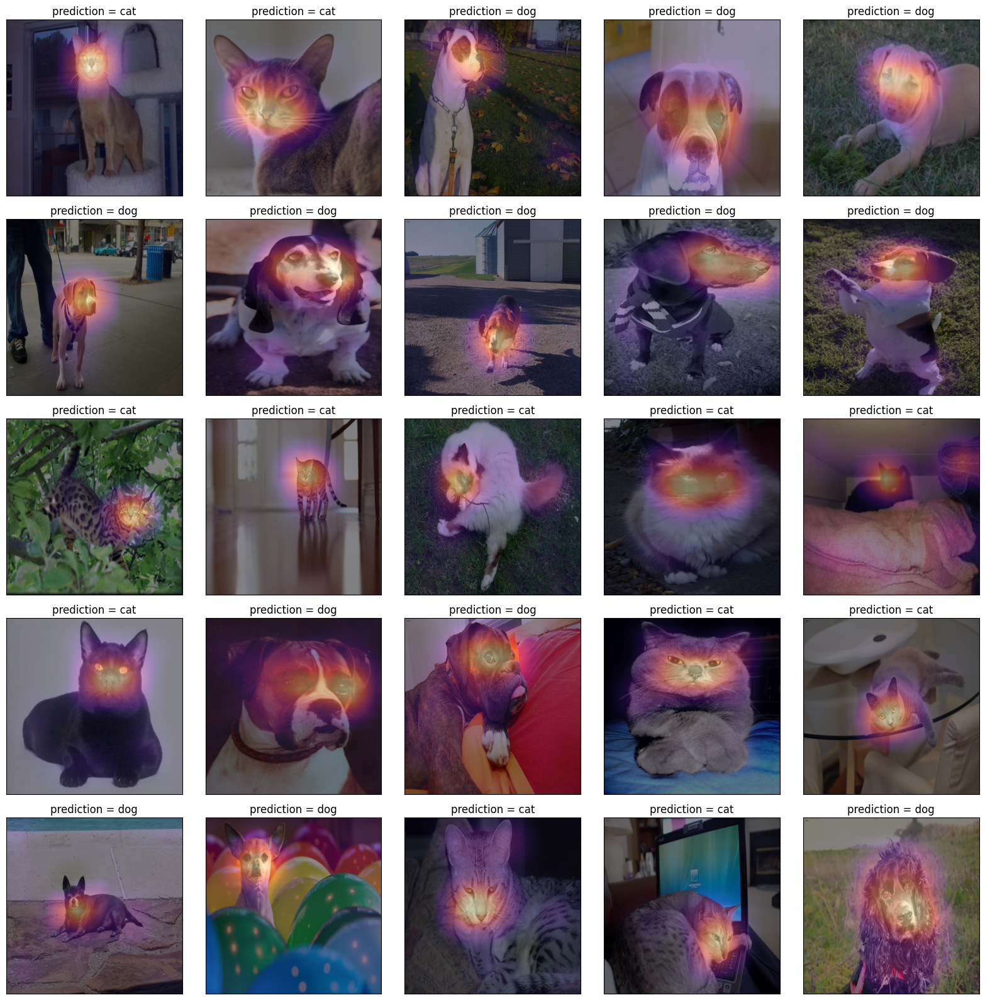

In [153]:
fig, ax = plt.subplots(5,5)
#---#
k = 1 
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

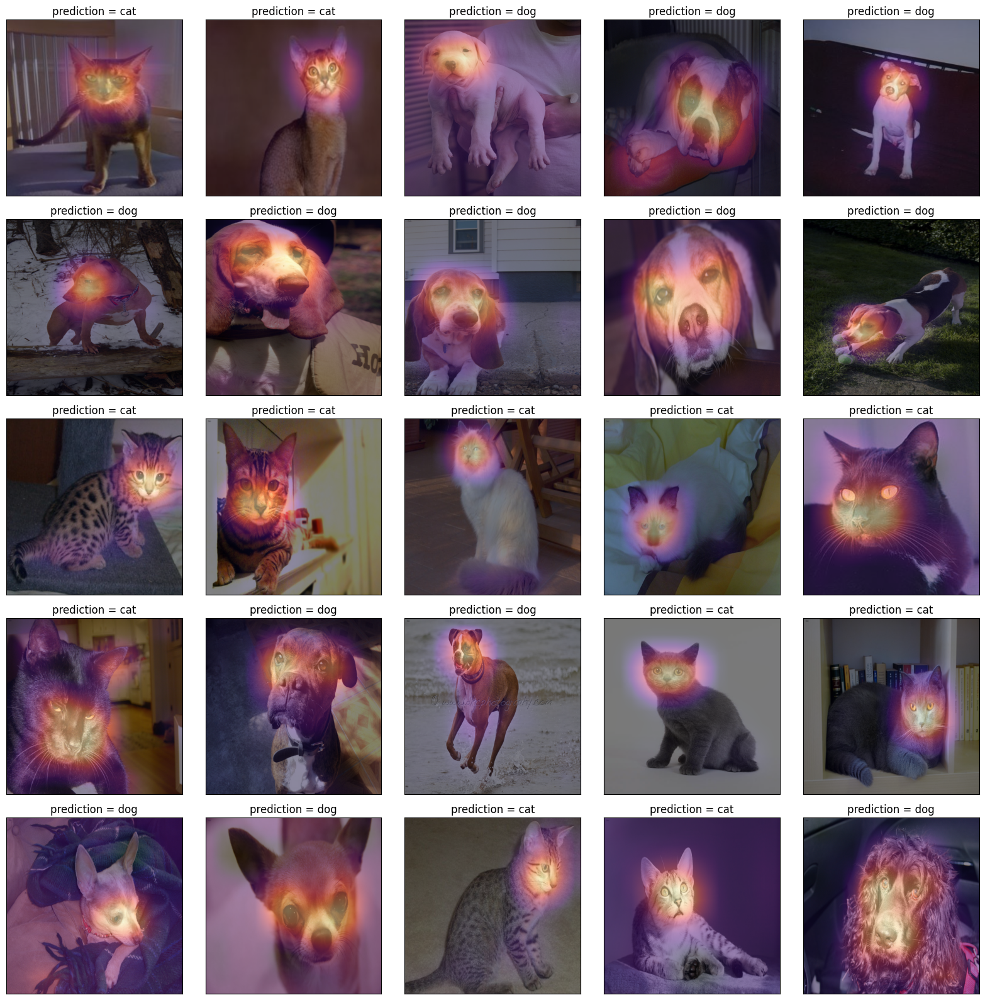

In [154]:
fig, ax = plt.subplots(5,5)
#---#
k = 2
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

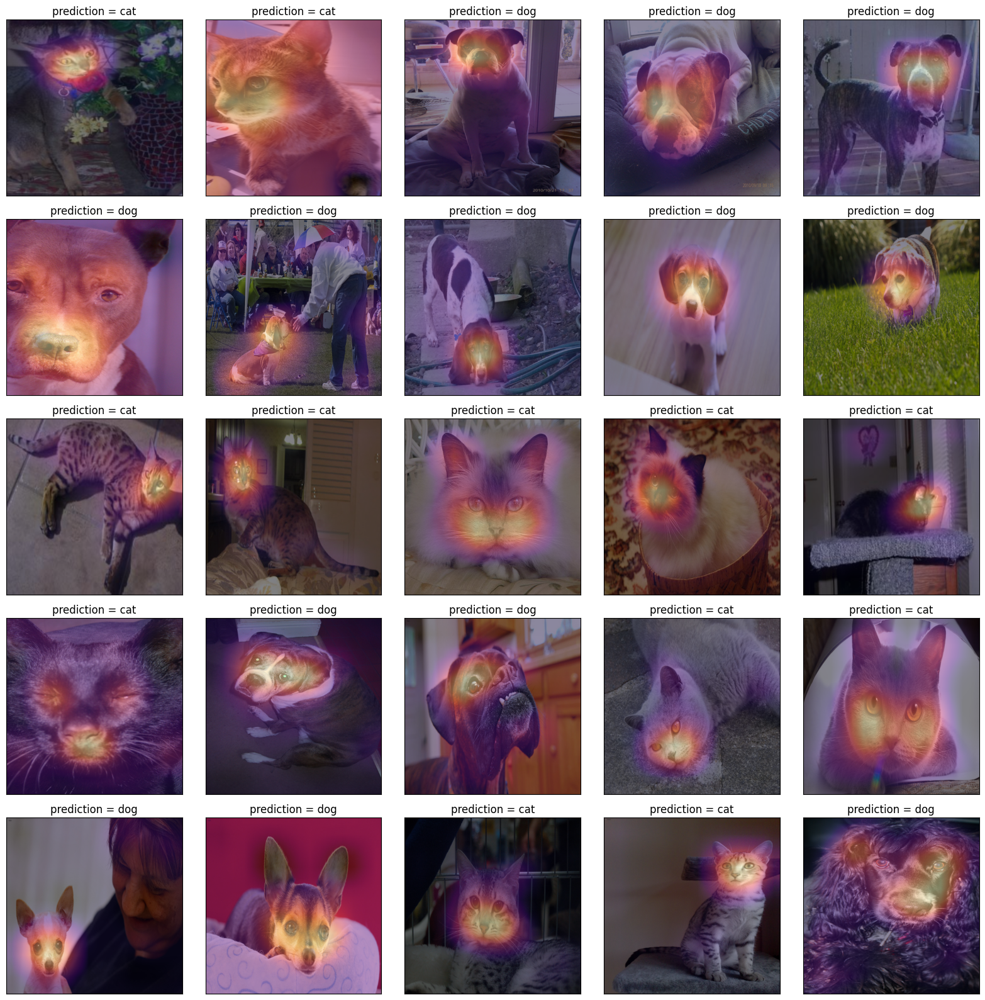

In [155]:
fig, ax = plt.subplots(5,5)
#---#
k = 3
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

`#`

# 7. CAM의 한계

`-` 구조의 제약이 있음

-   head-part가 ap와 linr로만 구성되어야 가능
-   그렇지 않은 네트워크는 임의로 재구성하여 head-part를 ap와 linr로만
    구성 (CAM을 적용하기위한 구조로 만들기 위해서)

`-` 이후에 등장한 grad-cam의 경우 구조의 제약없이 거의 모든 CNN에
적용가능

Zhou, Bolei, Aditya Khosla, Agata Lapedriza, Aude Oliva, and Antonio
Torralba. 2016. “Learning Deep Features for Discriminative
Localization.” In *Proceedings of the IEEE Conference on Computer Vision
and Pattern Recognition*, 2921–29.